<a href="https://colab.research.google.com/github/ManciniGa/Doutorado/blob/main/YOLOv8_Treinamento_Custom_Curso_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLOv8 - Treinamento de modelo customizado

Lembrando que o dataset que criamos em aula já se encontra devidamente anotado e convertido para o formato usado pelo YOLO. Isso foi explicado detalhadamente na aula sobre criação do dataset, onde além de fazer a preparação é feito o download de imagens do Open Images Dataset direto pelo Colab.

Caso deseje treinar outros objetos:
* Pode procurar pelo [Open Images Dataset](https://storage.googleapis.com/openimages/web/index.html) ou [Kaggle](https://www.kaggle.com) por exemplo, se há um dataset para a classe que deseja detectar.
* Ou pode criar você mesmo o dataset.
Além do LabelImg (que mostramos no curso como é possível fazer a anotação) segue outras ferramentas para fazer a anotação direto pelo navegador e assim não precisar baixar nenhum programa:
  * [MakeSense.ai](https://www.makesense.ai), [CVAT](https://www.cvat.ai), ou ainda a plataforma do [Roboflow](https://app.roboflow.com/login) (inclusive eles oferecem uma integração mais direta com YOLOv8).

Obs: se o seu dataset estiver em outro formato de anotação que não seja do YOLO nem o padrão usado pelo OID, então você pode adaptar o nosso script de conversão de anotações, ou ainda dar uma olhada nas ferramentas que o Roboflow oferece para converter o formato das anotações: https://roboflow.com/formats/yolov8-pytorch-txt

In [1]:
!nvidia-smi

Thu Sep 12 11:06:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Preparação do dataset

A estrutura necessária é a seguinte

* /dataset
  * /train
  * /val

In [2]:
!mkdir dataset

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Copiando o conjunto de imagens de treinamento

In [4]:
!cp /content/gdrive/MyDrive/obj.zip ./


In [5]:
!unzip obj.zip -d dataset/

Archive:  obj.zip
   creating: dataset/obj/
  inflating: dataset/obj/a1a21212960595ca.jpg  
  inflating: dataset/obj/18edc752ff033d99.txt  
  inflating: dataset/obj/aff8fddebffefcc6.jpg  
  inflating: dataset/obj/e85b1b3e563c6c64.jpg  
  inflating: dataset/obj/00b7cee6cbe6af50.jpg  
  inflating: dataset/obj/60a2bdef6dd6f5a9.txt  
  inflating: dataset/obj/e7eef00020a07479.jpg  
  inflating: dataset/obj/3df080388574a241.txt  
  inflating: dataset/obj/1c9e268f001b42f9.jpg  
  inflating: dataset/obj/500cd13bf577569e.jpg  
  inflating: dataset/obj/b45fbea797df0b03.jpg  
  inflating: dataset/obj/707505c950161abc.txt  
  inflating: dataset/obj/64e08adeb995bf18.txt  
  inflating: dataset/obj/08bff1d182303ff1.jpg  
  inflating: dataset/obj/02cc329ef3f1f7fb.jpg  
  inflating: dataset/obj/c11514dc14e894e5.txt  
  inflating: dataset/obj/62a0efc5539b2dfb.jpg  
  inflating: dataset/obj/ee30e5ff15d5847b.jpg  
  inflating: dataset/obj/5062a421e651b998.txt  
  inflating: dataset/obj/c5c8be464ee09a86.jp

In [6]:
!mv dataset/obj dataset/train

### Copiando o conjunto de imagens de validação

In [7]:
!cp /content/gdrive/MyDrive/valid.zip ./

In [9]:
!unzip valid.zip -d dataset

Archive:  valid.zip
replace dataset/valid/57783c2ab99d0ede.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: dataset/valid/57783c2ab99d0ede.txt  
  inflating: dataset/valid/6e3b69ea7f539ba7.txt  
  inflating: dataset/valid/3c149d5b11e02ae4.jpg  
  inflating: dataset/valid/814912f96ea43a01.txt  
  inflating: dataset/valid/241f4648caa3d22b.txt  
  inflating: dataset/valid/07ef43face9d169b.jpg  
  inflating: dataset/valid/671cd4cf050530d1.jpg  
  inflating: dataset/valid/e831fe0b659117d1.jpg  
  inflating: dataset/valid/fd8b8c4a44f6e485.txt  
  inflating: dataset/valid/406512ee7efc2b43.jpg  
  inflating: dataset/valid/157d5242248e0537.jpg  
  inflating: dataset/valid/48f1452c11232b15.txt  
  inflating: dataset/valid/7f5a30978d018d2f.txt  
  inflating: dataset/valid/a421445b187d6d2c.jpg  
  inflating: dataset/valid/b3e9352cb0ef77d2.txt  
  inflating: dataset/valid/46de7cd9966312ed.txt  
  inflating: dataset/valid/c87e54bfeae26632.txt  
  inflating: dataset/valid/93b8c2d62b4e602c.jp

## Instalação das ferramentas do YOLOv8

In [10]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.9/871.9 kB 29.9 MB/s eta 0:00:00


In [11]:
from ultralytics import YOLO
import os
import cv2
import matplotlib.pyplot as plt

## Configurações do arquivo YAML

In [12]:
!touch configs_modelo.yaml

Agora, precisamos preencher esse arquivo com os parâmetros necessários

* path: [caminho do diretório que contém o dataset]
* train: [caminho do conjunto de treinamento, relativo ao path]
* val: [caminho do conjunto de validação, relativo ao path]
* test: [não é necessário pois faremos depois um teste manual]

**Número de Classes**
* nc: [coloca o numero de classes que deseja treinar]

**Nomes/Labels - substitua pelos nomes das classes**
* names: [nome de cada classe, dentro de '' e separado por vírgula]

Para escrever esses valores no arquivo, podemos usar o comando %%writefile

In [13]:
%%writefile configs_modelo.yaml
path: '/content/dataset/'
train: 'train/'
val: 'valid/'
test: # opcional

nc: 3
names: ['Apple', 'Coffe Cup', 'Horse']

Overwriting configs_modelo.yaml


## Treinamento do modelo

In [14]:
diretorio_raiz = '/content/'
arquivo_config = os.path.join(diretorio_raiz, 'configs_modelo.yaml')

In [15]:
arquivo_config

'/content/configs_modelo.yaml'

In [ ]:
#!yolo task=detect mode=train data={arquivo_config} epochs=10

> **Parâmetros da função de treinamento:**

* task: o que queremos com o treinamento. Como estamos trabalhando com detecção de objetos, deixe o valor = detect. Outras opções aceitas: segment, e classify. É opcional passarmos se queremos detecção, pois por padrão ele já considera como sendo detecção a não ser que especifique outra forma.
* mode: pode ser train, val, ou predict. Como estamos fazendo pela forma usando python e queremos o treinamento vamos usar a função train(), portanto esse parâmetro se torna desnecessário .
* **model**: o modelo pré-treinado que queremos usar como "partida". Pode ser o YOLOv8 Nano (YOLOv8n), YOLOv8 Small (YOLOv8s), etc.
* **imgsz**: O tamanho da imagem, que a rede realiza o processamento (obs: você não precisa redimensionar a imagem para esse tamanho antes, o algoritmo cuida dessa parte antes de passar a imagem de entrada para a rede). A resolução padrão é 640x640 pixels, portanto o valor padrão é 640. Quando maior o tamanho mais precisa é a detecção, principalmente para objetos com detalhes pequenos, porém é mais demorado o treinamento e detecção.  
* **data**: caminho para o arquivo YAML. Esse é o arquivo que criamos acima, que contém o caminho para o conjunto de treinamento e validaçao, além disso deve conter os nomes das classes que queremos treinar.
* **epochs**: Numero de epocas que desejamos treinar.
* **batch**: O tamanho do batch (lote) para o carregador de dados. Você pode aumentá-lo ou diminuí-lo de acordo com a disponibilidade de memória de sua GPU, por exemplo caso venha a encontrar problema de memória. O valor padrão é 16.
* **name**: Nome do diretório de resultados para o runs/detect. (opcional)

Em nossos testes vamos escolher o Nano, ou até mesmo o Small, pois queremos que seja um treinamento relativamente mais rápido

In [16]:
model = YOLO('yolov8s.yaml')

In [17]:
resultados = model.train(data=arquivo_config, epochs=10, imgsz=640, name='yolov8s_modelo')

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/configs_modelo.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_modelo, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 22.3MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 92.8MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset/train... 1498 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1498/1498 [00:00<00:00, 1997.30it/s]

train: New cache created: /content/dataset/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/dataset/valid... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<00:00, 1473.91it/s]

val: New cache created: /content/dataset/valid.cache


Plotting labels to runs/detect/yolov8s_modelo/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8s_modelo
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.08G      2.992      4.419      4.092         12        640: 100%|██████████| 94/94 [00:43<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]

                   all        300        505    0.00459      0.371     0.0127    0.00387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.02G      2.869      4.029       3.55         20        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]


                   all        300        505    0.00381      0.575     0.0109    0.00336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.05G      2.606      3.864      3.249         18        640: 100%|██████████| 94/94 [00:40<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        300        505      0.337      0.159     0.0178    0.00631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.01G      2.486      3.663      3.088         20        640: 100%|██████████| 94/94 [00:40<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]

                   all        300        505      0.391      0.148     0.0499      0.016



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      3.93G      2.449       3.38      3.003         12        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]


                   all        300        505      0.441       0.15     0.0909     0.0346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.02G      2.335      3.213      2.878         10        640: 100%|██████████| 94/94 [00:39<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]

                   all        300        505      0.105      0.201     0.0654     0.0249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.03G      2.236      3.008      2.802         27        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]


                   all        300        505      0.193      0.255      0.143     0.0587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.01G      2.144      2.828      2.697         38        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]

                   all        300        505      0.282      0.267      0.196     0.0863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      3.87G      2.084      2.711      2.634         23        640: 100%|██████████| 94/94 [00:42<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]

                   all        300        505      0.273      0.364      0.233      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.01G      2.021      2.604      2.603         16        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        300        505       0.25      0.359      0.199      0.101



10 epochs completed in 0.133 hours.
Optimizer stripped from runs/detect/yolov8s_modelo/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/yolov8s_modelo/weights/best.pt, 22.5MB

Validating runs/detect/yolov8s_modelo/weights/best.pt...
Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        300        505      0.273      0.364      0.233      0.109
                 Apple        100        239      0.189      0.418      0.235      0.132
             Coffe Cup        100        130      0.271        0.4      0.262      0.122
                 Horse        100        136      0.358      0.272      0.204     0.0726
Speed: 0.2ms preprocess, 4.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/yolov8s_modelo


In [18]:
dir_resultado = '/content/runs/detect/yolov8s_modelo'

### Avaliação (Verificando o mAP do modelo)

In [19]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [20]:
!yolo task=detect mode=val model={dir_resultado}/weights/best.pt name=yolov8s_modelo_eval data=configs_modelo.yaml

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/dataset/valid.cache... 300 images, 0 backgrounds, 0 corrupt: 100% 300/300 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [00:08<00:00,  2.21it/s]
                   all        300        505      0.269      0.361      0.233      0.108
                 Apple        100        239      0.187      0.418      0.238      0.133
             Coffe Cup        100        130      0.264        0.4       0.26       0.12
                 Horse        100        136      0.355      0.265      0.202     0.0711
Speed: 3.0ms preprocess, 8.6ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/yolov8s_modelo_eval
💡 Learn more at https://docs.ultralytics.com/modes/val


### Exibindo os gráficos

In [21]:
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

In [ ]:
#resultados_grafico

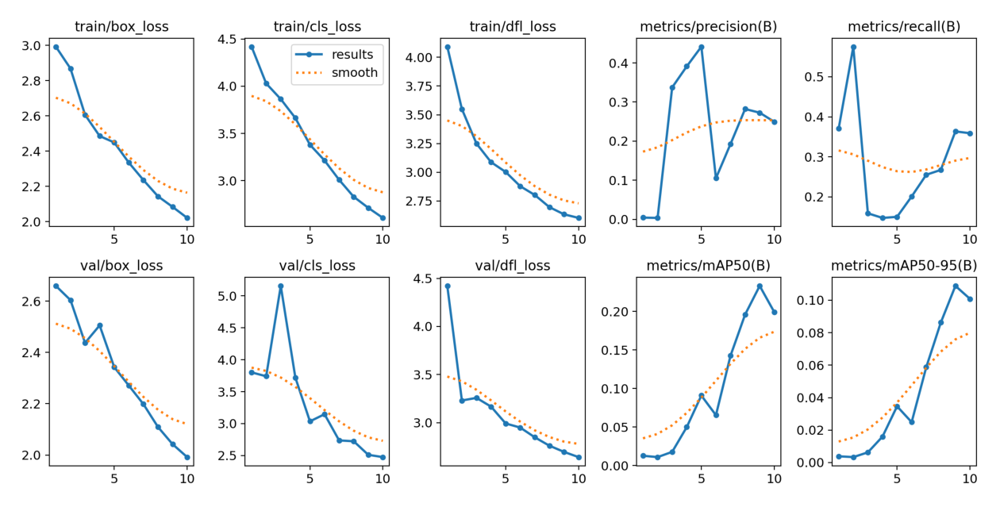

In [22]:
resultados_grafico = cv2.imread(os.path.join(dir_resultado, 'results.png'))
mostrar(resultados_grafico)

In [23]:
dir_resultado_val = 'runs/detect/yolov8s_modelo_eval'

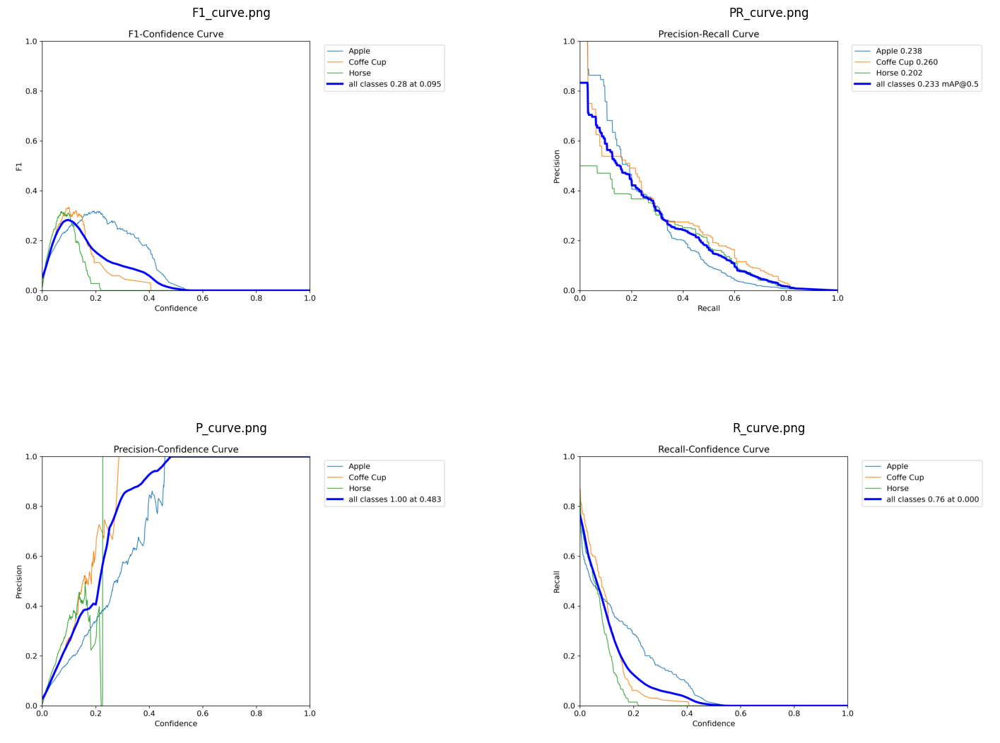

In [24]:
imgs = ['F1_curve.png', 'PR_curve.png', 'P_curve.png', 'R_curve.png']
plt.figure(figsize=(18,14))
for i, img in enumerate(imgs):
  #print(i, img)
  grafico = cv2.imread(os.path.join(dir_resultado_val, img))
  #print(grafico)
  grafico = cv2.cvtColor(grafico, cv2.COLOR_BGR2RGB)
  plt.subplot(2, 2, i + 1)
  plt.title(imgs[i])
  plt.imshow(grafico)
  plt.axis('off')
plt.show()

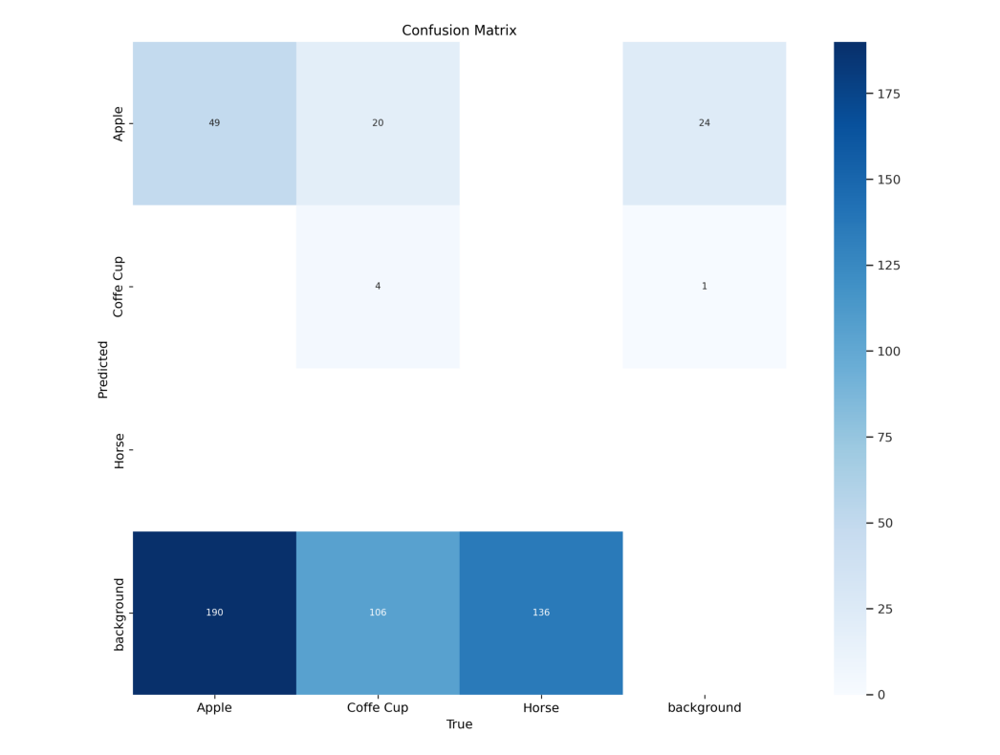

In [25]:
matriz_confusao = cv2.imread(os.path.join(dir_resultado_val, 'confusion_matrix.png'))
mostrar(matriz_confusao)

## Testando o modelo treinado


In [26]:
!mkdir imagens_teste

In [27]:
!yolo task=detect mode=predict model={dir_resultado}/weights/best.pt source='/content/imagens_teste' save=true conf=0.05

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

image 1/5 /content/imagens_teste/apple.jpg: 448x640 3 Apples, 1 Coffe Cup, 59.4ms
image 2/5 /content/imagens_teste/cachorro_gato.jpg: 608x640 1 Apple, 67.3ms
image 3/5 /content/imagens_teste/cachorros.jpg: 448x640 2 Horses, 14.1ms
image 4/5 /content/imagens_teste/cachorros02.jpg: 448x640 2 Horses, 13.7ms
image 5/5 /content/imagens_teste/caneca01.jpg: 384x640 3 Apples, 70.5ms
Speed: 3.7ms preprocess, 45.0ms inference, 201.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


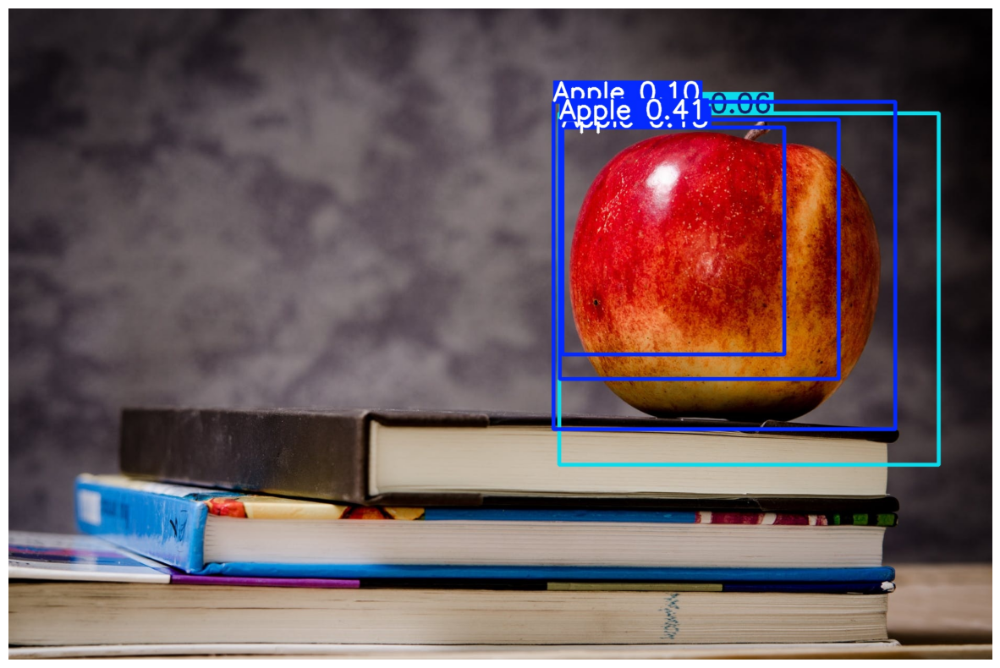

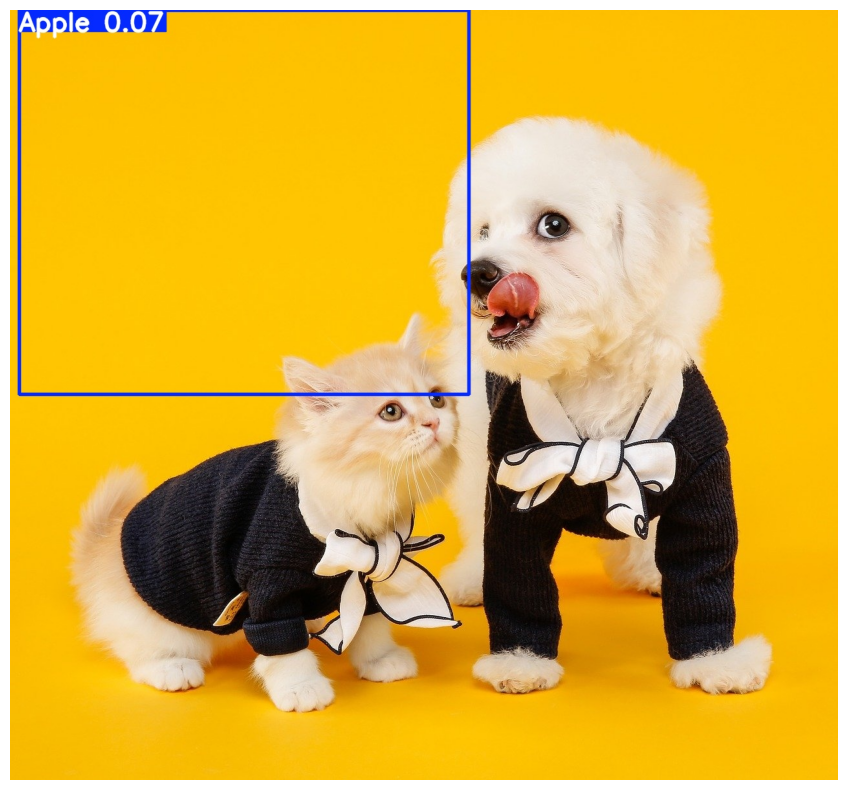

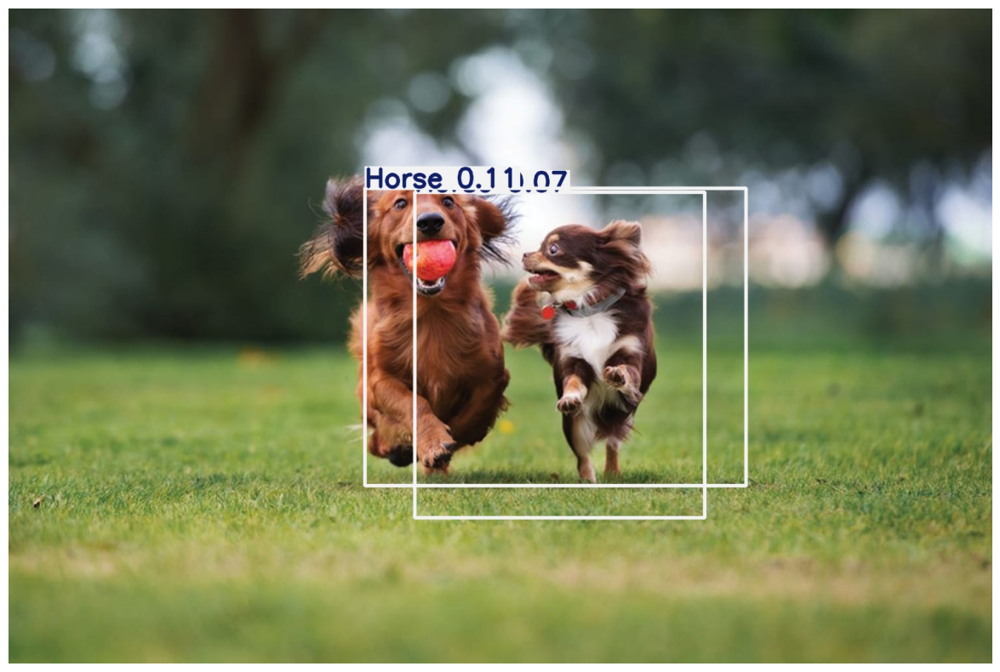

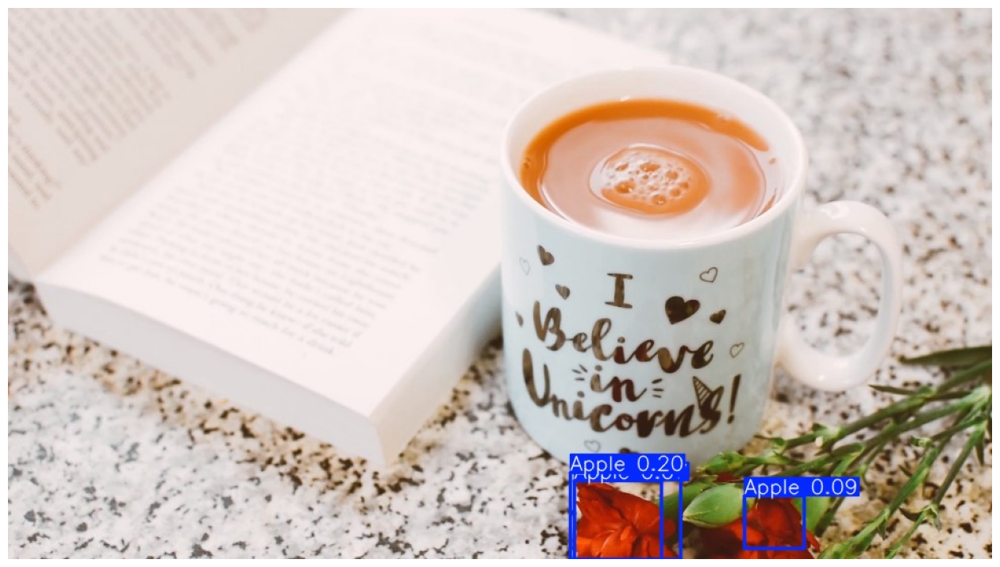

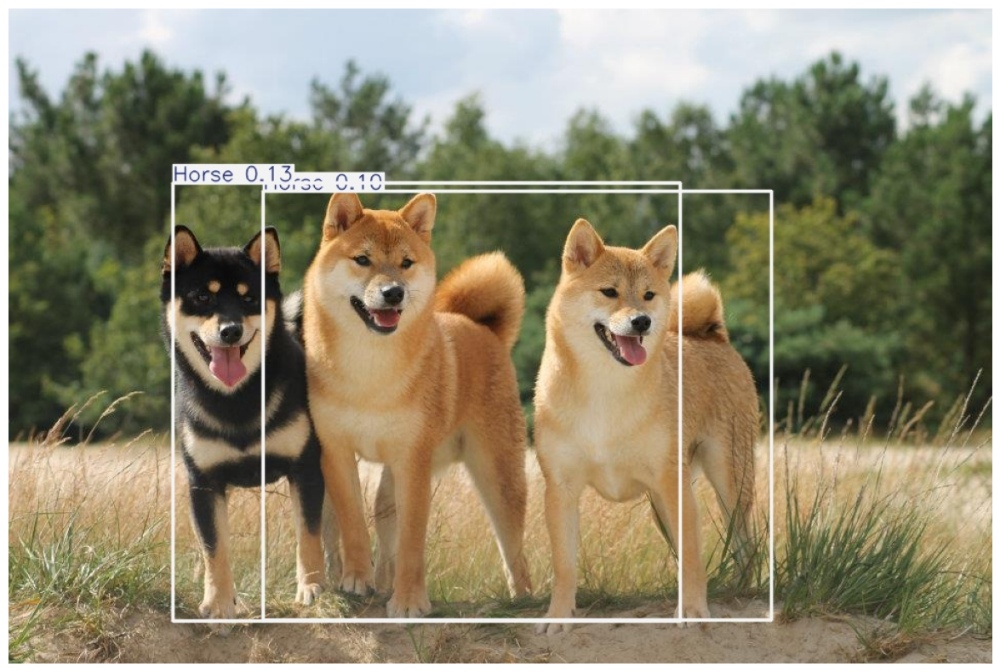

In [29]:
dir_predicoes = 'runs/detect/predict/'
caminhos = [os.path.join(dir_predicoes, f) for f in os.listdir(dir_predicoes)]
#print(caminhos)
for caminho_imagem in caminhos:
  imagem = cv2.imread(caminho_imagem)
  mostrar(imagem)

## Continuar treinamento



In [30]:
!yolo task=detect mode=train model={dir_resultado}/weights/last.pt data={arquivo_config} epochs=10

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/yolov8s_modelo/weights/last.pt, data=/content/configs_modelo.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fal

In [31]:
!yolo task=detect mode=val model={dir_resultado}/weights/best.pt name=yolov8s_modelo_eval data=configs_modelo.yaml

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/dataset/valid.cache... 300 images, 0 backgrounds, 0 corrupt: 100% 300/300 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [00:06<00:00,  3.13it/s]
                   all        300        505      0.269      0.361      0.233      0.108
                 Apple        100        239      0.187      0.418      0.238      0.133
             Coffe Cup        100        130      0.264        0.4       0.26       0.12
                 Horse        100        136      0.355      0.265      0.202     0.0711
Speed: 1.2ms preprocess, 7.8ms inference, 0.1ms loss, 3.7ms postprocess per image
Results saved to runs/detect/yolov8s_modelo_eval2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [32]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt source='imagens_teste' save=true

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

image 1/5 /content/imagens_teste/apple.jpg: 448x640 1 Apple, 1 Coffe Cup, 62.4ms
image 2/5 /content/imagens_teste/cachorro_gato.jpg: 608x640 (no detections), 68.6ms
image 3/5 /content/imagens_teste/cachorros.jpg: 448x640 (no detections), 14.3ms
image 4/5 /content/imagens_teste/cachorros02.jpg: 448x640 (no detections), 13.0ms
image 5/5 /content/imagens_teste/caneca01.jpg: 384x640 1 Coffe Cup, 64.0ms
Speed: 3.8ms preprocess, 44.5ms inference, 202.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


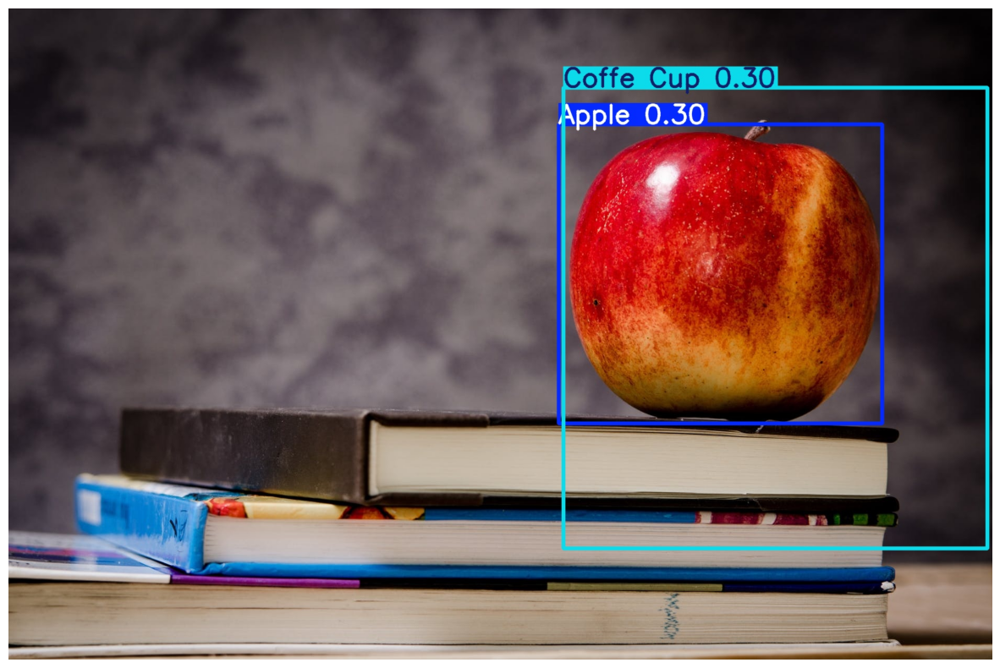

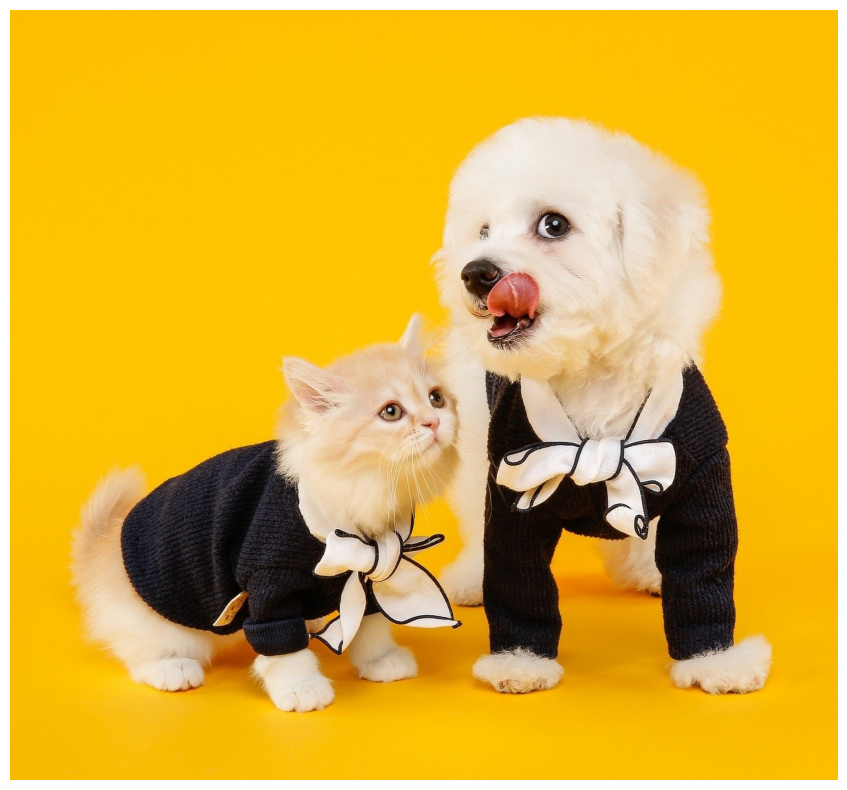

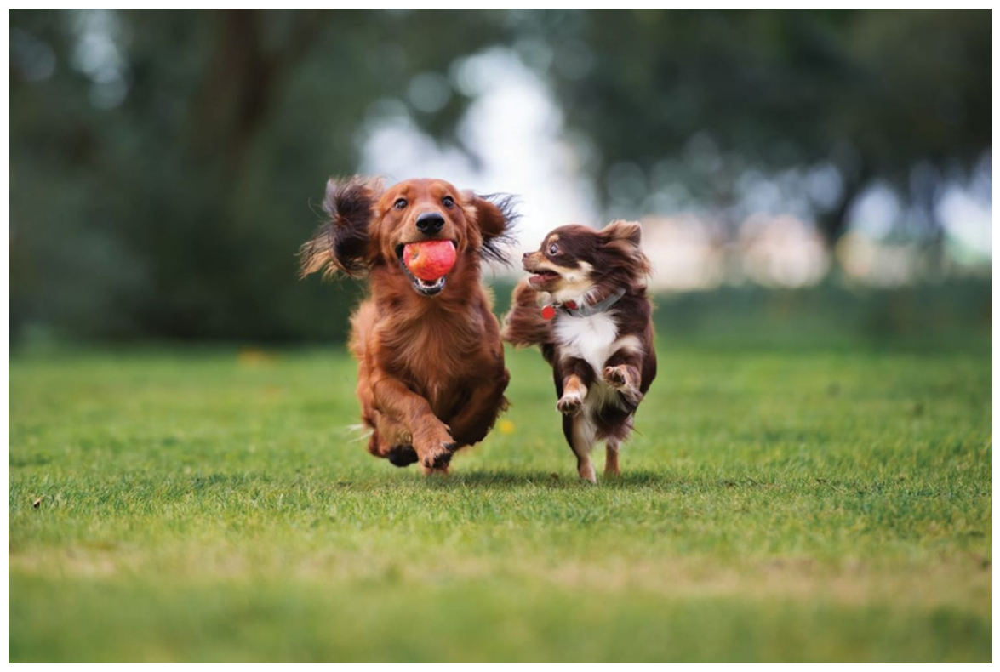

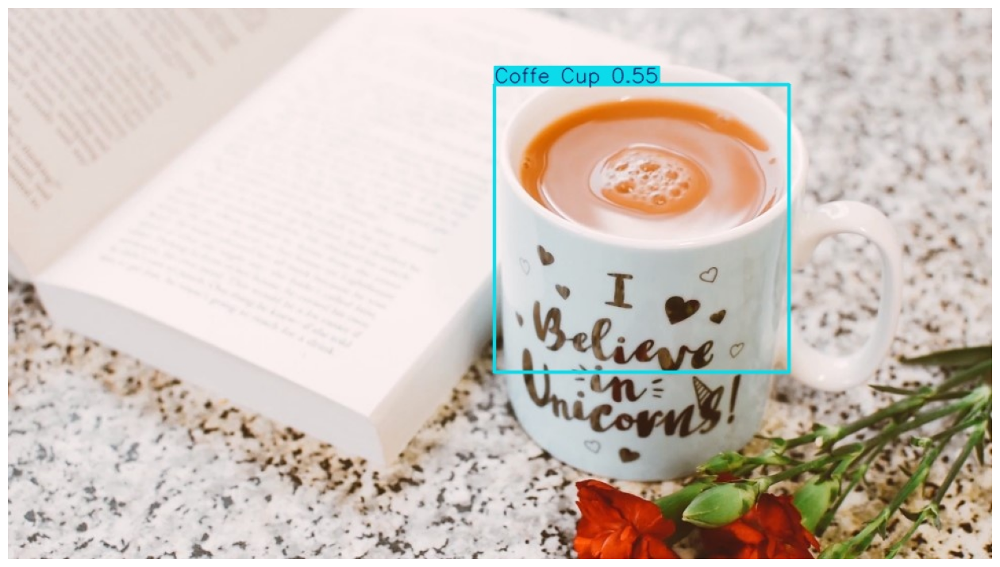

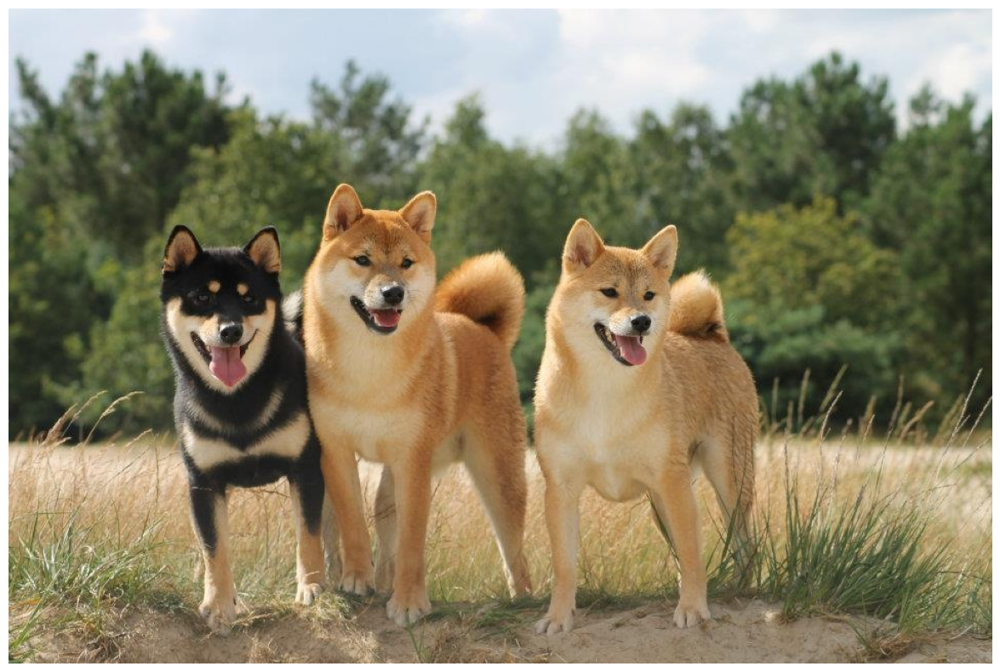

In [34]:
dir_predicoes = 'runs/detect/predict2/'
caminhos = [os.path.join(dir_predicoes, f) for f in os.listdir(dir_predicoes)]
#print(caminhos)
for caminho_imagem in caminhos:
  imagem = cv2.imread(caminho_imagem)
  mostrar(imagem)

## Enviar para o Google Drive

In [35]:
!cp -R {dir_resultado} /content/gdrive/MyDrive/Resultados/yolov8

## Exportar para outros formatos

In [36]:
os.path.join(dir_resultado, 'weights', 'best.pt')

'/content/runs/detect/yolov8s_modelo/weights/best.pt'

In [37]:
model_treinado = YOLO(os.path.join(dir_resultado, 'weights', 'best.pt'))
model_treinado.export(format='onnx')

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.00GHz)
YOLOv8s summary (fused): 168 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/content/runs/detect/yolov8s_modelo/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (21.5 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 304.0 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 8.6s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.16.2 opset 19...
ONNX: export success ✅ 10.1s, saved as '/content/runs/detect/yolov8s_modelo/weights/best.onnx' (42.7 MB)

Export complete (12.4s)
Results saved to /content/runs/detect/yolov8s_modelo/weights
Predict:         yolo predict task=detect model=/content/runs/detect/yolov8s_modelo/weights/best.on

'/content/runs/detect/yolov8s_modelo/weights/best.onnx'

Confira a tabela com os formatos aceitos e qual o valor do parâmetro deve ser usado para salvar no formato específico

| Format                                                                     | `format=`          | Model                     |
|----------------------------------------------------------------------------|--------------------|---------------------------|
| [PyTorch](https://pytorch.org/)                                            | -                  | `yolov8n.pt`              |
| [TorchScript](https://pytorch.org/docs/stable/jit.html)                    | `torchscript`      | `yolov8n.torchscript`     |
| [ONNX](https://onnx.ai/)                                                   | `onnx`             | `yolov8n.onnx`            |
| [OpenVINO](https://docs.openvino.ai/latest/index.html)                     | `openvino`         | `yolov8n_openvino_model/` |
| [TensorRT](https://developer.nvidia.com/tensorrt)                          | `engine`           | `yolov8n.engine`          |
| [CoreML](https://github.com/apple/coremltools)                             | `coreml`           | `yolov8n.mlmodel`         |
| [TensorFlow SavedModel](https://www.tensorflow.org/guide/saved_model)      | `saved_model`      | `yolov8n_saved_model/`    |
| [TensorFlow GraphDef](https://www.tensorflow.org/api_docs/python/tf/Graph) | `pb`               | `yolov8n.pb`              |
| [TensorFlow Lite](https://www.tensorflow.org/lite)                         | `tflite`           | `yolov8n.tflite`          |
| [TensorFlow Edge TPU](https://coral.ai/docs/edgetpu/models-intro/)         | `edgetpu`          | `yolov8n_edgetpu.tflite`  |
| [TensorFlow.js](https://www.tensorflow.org/js)                             | `tfjs`             | `yolov8n_web_model/`      |
| [PaddlePaddle](https://github.com/PaddlePaddle)                            | `paddle`           | `yolov8n_paddle_model/`   |



